In [1]:
using Plots, StatsBase

In [ ]:
n=10000
x = 1 .+ log.(1 ./ rand(n))
y = 1 .+ 1 ./ (rand(n).^2)
z = 1 .+ abs.(randn(n)./randn(n));

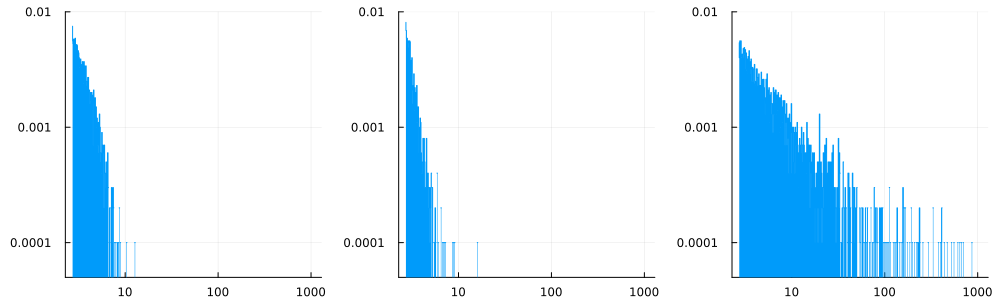

In [17]:
function histo(data, plot_fit=false, B=7)
    h = fit(Histogram, log.(data), range(1,B,500))#, nbins=range(1,50,500))
    log_edges = collect(h.edges[1])[1:end-1]
    weights = (h.weights)/length(data)
    log_weights = log.(weights)
    
    p = plot(log_edges, 10 .+ log_weights, linetype=:steppre, fillrange = 0, label=nothing)

    if plot_fit
        X = cat(log_edges, ones(499), dims=2)
        YY = log_weights[weights .> 0]
        XX = X[weights .>0 ,:]
        β = XX \ YY
        plot!(XX[:,1], 10 .+ XX*β, lw=5,label="linear fit, s=$(round(1-β[1], sigdigits=2))", alpha=0.8)
    end

    xticks = [10,100,1000]
    yticks = [0.0001,0.001, 0.01, 0.1]
    plot!(p, 
        xticks=(log.(xticks), xticks), 
        yticks=(10 .+ log.(yticks), yticks), 
        ylims=(10+log(0.00005), 10+log(0.01)), 
        legend=:topright
    )

    
    return p 
end 
p1, p2, p3 = histo(x, false), histo(y, false), histo(z, false)
h1 = plot(p1,p2,p3, layout=(1,3), size=(1000,300))
#savefig(h1, "../img/histo_tail.png")
h1

In [ ]:
p1, p2, p3 = histo(x, true), histo(y, true), histo(z, true)
h2 = plot(p1,p2,p3, layout=(1,3), size=(1000,300))
#savefig(h2, "../img/histo_tail_fit.png")
h2

In [ ]:
function ranko(data, plot_fit=false)
    sdata, n = sort(data), length(data) 
    y=[log((n - i + 1)/n) for i in 1:n]
    p = scatter(log.(sdata), y, markerstrokewidth=0, label=nothing)
    #plot!(p, legend=nothing, xlims=(0,100), xaxis=:log, yaxis=:log, xticks=([1, 100, 1000],[1, 100, 1000] ))

    if plot_fit 
        X = cat(log.(sdata), ones(n), dims=2) 
        β = X \ y
        plot!(p, log.(sdata), X*β, lw=5, label="linear fit, s=$(round(β[1], sigdigits=2))", alpha=0.8)
    end

    xticks = [10,100,1000]
    yticks = [0.001,0.01, 0.1, 1]
    plot!(p, xlims=(0, log(2000)), xticks=(log.(xticks), xticks), yticks=(log.(yticks), yticks))
    plot!(p, legend=:topright)
    return p 
end 
plot_fit = false
p1, p2, p3 = ranko(x, plot_fit), ranko(y, plot_fit), ranko(z, plot_fit)
h3 = plot(p1,p2,p3, layout=(1,3), size=(1000,300))
#savefig(h3, "../img/rank_plot.png")
h3

In [ ]:
plot_fit = true
p1, p2, p3 = ranko(x, plot_fit), ranko(y, plot_fit), ranko(z, plot_fit)
h4 = plot(p1,p2,p3, layout=(1,3), size=(1000,300))
#savefig(h4, "../img/rank_plot_fit.png")


| model 1      | model 2 | model 3 |
| ----------- | ----------- | --- |
| 0.86      | 0.72       | 1.25 | 

In [ ]:
function pareto_mle(data)
    invs = sum(log.(data))/length(data)
    return 1/invs
end

println("$(pareto_mle(x)) |  $(pareto_mle(y)) |  $(pareto_mle(z))")

In [ ]:
u = 0:0.01:5
v = exp.(-u.^2 / 2) ./ (sqrt(2*pi)*u)
w = 1 ./ (pi*u)
plot(u,v, label="Gaussian tail distribution", lw=3)
plot!(u,w, label="Cauchy tail distribution", lw=3)
p=plot!(ylims=(0,3), title="tail distributions")
#plot!(yaxis=:log, xlims=(0.1,10))


In [ ]:
plot(u,v, lw=3)
plot!(u,w, lw=3)
q = plot!(yaxis=:log, xlims=(0.1, 5), legend=nothing, title="log scale for y")
#plot!(yaxis=:log, xlims=(0.1,10))

In [ ]:
plot(u,v, lw=3)
plot!(u,w, lw=3)
r = plot!(yaxis=:log, xaxis=:log, xlims=(0.1, 5), legend=nothing, title="log scale for y")
#plot!(yaxis=:log, xlims=(0.1,10))

In [24]:
plot(p,q,layout=(1,2), size=(1000,200))
savefig("../img/tails.png")

"/home/simon/Documents/SimonCoste.github.io/posts/img/tails.png"

In [25]:
function hill(data)
    sdata, n = reverse(sort(data)), length(data)
    out = zeros(n-1)
    for k in 2:n
        out[k-1] = sum(log.(sdata[1:k] ./ sdata[k]))/k
    end 
    return 1 ./ out 
end
hx = hill(x)
hy = hill(y)
hz = hill(z) 


9999-element Vector{Float64}:
 1.2563743957910345
 1.3263626673060653
 1.3694274448326336
 1.3631044089973423
 1.048148743506933
 0.9908411368285233
 1.0844549995239643
 1.1651578667975178
 1.2316907864511881
 1.2059849039685633
 ⋮
 1.079177308490223
 1.0790431567501555
 1.0788282709224672
 1.0788590133296747
 1.0787004027055034
 1.078672999673657
 1.0787197452098187
 1.078715440145103
 1.0787512009382023

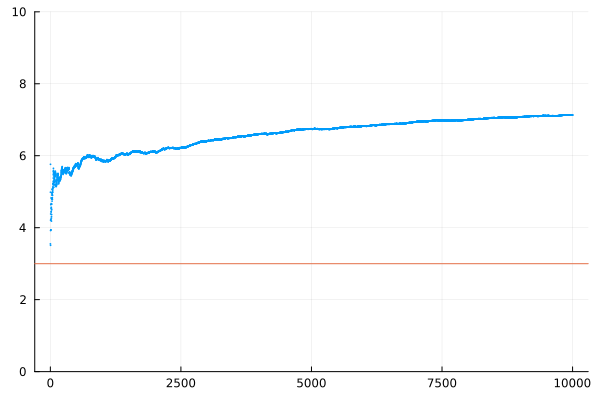

In [26]:

scatter(hy, markerstrokewidth=0, ms=1, legend=nothing, ylims=(0,10))
hiy = hline!([3])


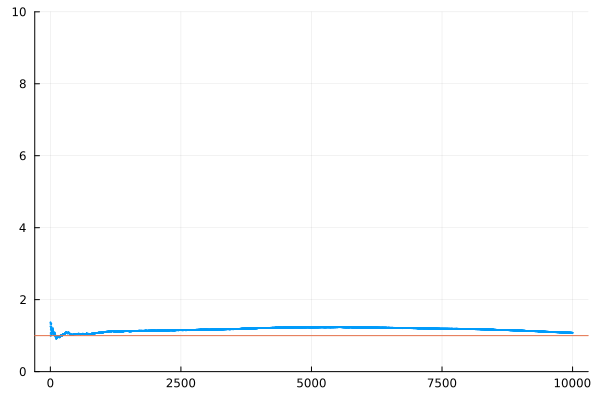

In [27]:
scatter(hz, markerstrokewidth=0, ms=1, legend=nothing, ylims=(0,10))
hiz = hline!([1])

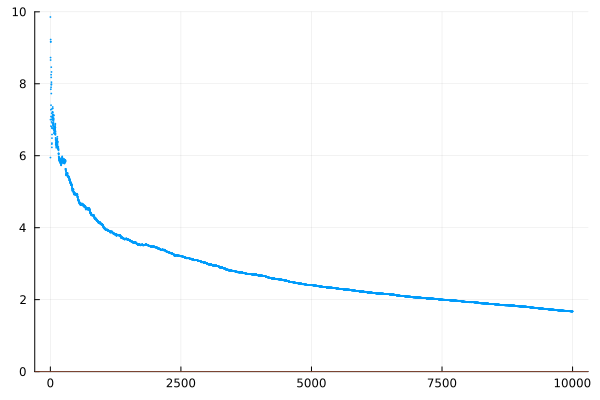

In [28]:
scatter(hx, markerstrokewidth=0, ms=1, legend=nothing, ylims=(0,10))
hix = hline!([0])

In [29]:
hillplots = plot(hix, hiy, hiz, layout=(1,3), size=(1000,300))
savefig(hillplots, "../img/hill_plots.png")

"/home/simon/Documents/SimonCoste.github.io/posts/img/hill_plots.png"